# 2. Timoshenko beam
For this second part, the response of a simply supported Timoshenko beam is modelled. The notebook distinguishes two problems: The Timoshenko Forward problem and the Timoshenko Inverse problem, discussed in sections 2.1 and 2.2 respectively.  Each section first explains the problem, consequently the method and solutions are explained for the respective problems. The behaviour of a timoshenko beam is described by the following coupled system of partial differential equations (PDE):

$
\left\{
\begin{aligned}
    \rho I \frac{\partial^2 \theta}{\partial t^2} - E I \frac{\partial^2 \theta}{\partial x^2} - k A G (\frac{\partial w}{\partial x} - \theta) &= 0 \\
    \rho A \frac{\partial^2 w}{\partial t^2} - k A G \left(\frac{\partial^2 w}{\partial x^2} - \frac{\partial \theta}{\partial x}\right) &= g(x, t)
\end{aligned}
\right.
$

where

$\rho$ is the density,  $I$ is the moment of inertia of the beam's cross-sectional area,
$E$ is the Young's modulus,
$A$ is the cross-sectional area of the beam,
$G$ is the shear modulus,
$\theta(x,t)$ represents the rotation about the beam axis,
$w(x,t)$ is the transverse displacement,
$k$ is another constant, and
$g(x,t)$ is an external force term.





In [ ]:
# Import necessary packages
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import altair as alt
from numpy import pi as pi
import pandas as pd
from torch.utils.data import DataLoader
%matplotlib inline
from ipywidgets import interact, fixed, widgets

In [ ]:
# Connect to Google Colab
from google.colab import drive

# This will prompt for authorization to access your Google Drive from Colab.
drive.mount('/content/drive', force_remount=True)

# After mounting, you can navigate to a specific folder using the usual UNIX cd command.
# Replace 'your_folder_path' with the actual path of your folder inside Google Drive.
folder_path = '/content/drive/My Drive/Colab Notebooks'  # Example path

%cd "$folder_path"

Mounted at /content/drive
/content/drive/My Drive/Colab Notebooks


## 2.1 Forward Problem

In the forward problem, the structural behaviour of a beam is predicted according the Timoshenko beam theory. Where Euler Bernoulli consists of 1 single PDE, the Timoshenko theory describes the beam's structural behaviour by 2 coupled PDE's. In system of equations, the timoshenko theory takes into the account the effects of transverse shear deformations, which are often of such a significancy that it can't be ignored [2]. In the forward problem, the task is simply come up with a sufficient output that approximates the real behaviour of the beam given the input and the governing physical laws.


In the first part of this project, a PINN is trained to estimate the exact values for the cross-sectional rotation and the transverse displacement, $\theta$ and w respectively, for the non-dimensionalized form of the Timoshenko beam. For the neural network a MultiLayer Perceptron is used with 4 hidden layers, 20 neurons per layer, input x and t, and output $\theta$ and w. The loss function consists of three parts: the boundary conditions, initial conditions, and a physics loss. These parts are regularized with a hyperparameters $\lambda$1, $\lambda$2, and $\lambda$3, which can be used to prioritize certain terms of the loss.
Other hyperparameters are the learning rate, number of epochs and which optimiser to choose. These hyperparameters are determined by reviewing similar research [1] and manually optimised by comparing the relative test errors of resulting models.

A schematic of the solution method using a PINN can be seen below.

![Schematic of the PINN that approximates the exact solutions for theta and w](https://github.com/DaanExterkate/CEGM2003---BEAM2/blob/main/Timoshenko%20forward%20schematic.png?raw=true "Schematic of the PINN that approximates the exact solutions for theta and w")

For this Forward Timoshenko Beam, the following initial and boundary conditions are set.

### Initial conditions:
$\left\{
\begin{aligned}
    \theta(x, 0) &= \frac{\pi}{2} \cos(x) + \frac{\pi}{2} \left(x - \frac{\pi}{2}\right) \\
    \theta_t(x, 0) &= 0 \\
    w(x, 0) &= \frac{\pi}{2} \sin(x) \\
    w_t(x, 0) &= 0
\end{aligned}
\right.$

### Boundary conditions:
$\left\{
\begin{aligned}
    \theta(0, t) &= 0 \\
    \theta(\pi, t) &= 0 \\
    w(0, t) &= 0 \\
    w(\pi, t) &= 0
\end{aligned}
\right.$

And the force function is defined as:

$g(x, t) = \cos(t) - \frac{\pi}{2} \sin(x) \cos(t)$

To find the errors for the obtained results for $\theta$ and $w$, the following 2 exact analytical solutions for $\theta$ and $w of this problem are:

$\left\{
\begin{aligned}
    \theta(x, t) &= \frac{\pi}{2} \cos(x) + \frac{\pi}{2} \cos(t) \\
    w(x, t) &= \frac{\pi}{2} \sin(x) \cos(t)
\end{aligned}
\right.$



These are all the input values/ formulas that are needed. We can start setting up the PINN to solve the Forward Problem. The code below defines the MLP class and the necessary function for the exact solutions for theta and w and the force function.

In [ ]:
A# Define the MLP class
class MLP(nn.Module):
    "Defines a basic multi-layer perceptron."
    def __init__(self, input_size, hidden_features, output_size, hidden_layers=1, activation_function='ReLU'):
        super(MLP, self).__init__()
        '''
        Constructor to built the neural network (MLP, Multi-layer perceptron)

        Parameters
        -------------------------------
        input_size :            float
                                number of input dimensions
        hidden_features :       float
                                Amount of neurons per hidden layer
        output_size :           float
                                output size
        hidden_layers :         float
                                Amount of hidden layers
        activation_function :   string
                                Activation type used. Either 'relu', 'tanh' or 'sigmoid'
        '''
        # Store the necessary parameters
        self.hidden_layers = hidden_layers

        # Store the activation function
        if activation_function.lower() == 'relu':
            self.activate = nn.ReLU()
        elif activation_function.lower() == 'tanh':
            self.activate = nn.functional.tanh
        elif activation_function.lower() == 'sigmoid':
            self.activate = nn.Sigmoid
        else:
            raise Exception(f'Activation function {activation_function} is invalid. Use relu, tanh or sigmoid.')

        # Define the layers of the network
        self.fc_inlayer = nn.Linear(input_size, hidden_features)
        self.fc_hiddenlayers = nn.ModuleList([nn.Linear(hidden_features, hidden_features) for _ in range(hidden_layers-1)])
        self.fc_outlayer = nn.Linear(hidden_features, output_size)

    def forward(self, x):
        '''
        Method to build the neural network

        Parameters
        --------------------------------
        x =     torch.Tensor
                Input values for the neural network. In this case; x and t values.

        Return
        ---------------------------------
        output: torch.Tensor
                Output of the neural network
        '''
        # Define the forward pass
        x = self.fc_inlayer(x)                      # Input layer
        x = self.activate(x)

        for layer in range(self.hidden_layers-1):
            x = self.fc_hiddenlayers[layer](x)      # Sublayers
            x = self.activate(x)

        output = self.fc_outlayer(x)                # Output layer
        return output

In [ ]:
def exact_solution(x, t):
    '''
    Calculates the analytical solution of the Timoshenko PDE.
    parameters
    -----------------
    x:      torch.Tensor
            distance x values
    t:      torch.Tensor
            time t values

    return
    ------------------
    theta, w = values of w and theta for given x and t
    '''
    theta = (np.pi/2 * np.cos(x) + (x - np.pi/2)) * np.cos(t)
    w = np.pi/2 * np.sin(x) * np.cos(t)
    return theta, w

def g(x, t):
  '''Calculates the space and time dependent forcing g for the Timoshenko beam.
  parameters
  -----------------
  x:      torch.Tensor
          distance x values
  t:      torch.Tensor
          time t values

  return
  ------------------
  g = force values for given x and t
  '''
  g = torch.cos(t) - torch.pi/2 * torch.sin(x) * torch.cos(t)
  return g

def f(x, t):
  '''
  Calculates the space and time dependent forcing f for the Euler-Bernoulli beam.
  parameters
  -----------------
  x:      torch.Tensor
          distance x values
  t:      torch.Tensor
          time t values

  return
  ------------------
  f = force values for given x and t
  '''
  f = (1 - 16 * torch.pi**2) * torch.sin(x) * torch.cos(4*torch.pi*t)
  return f

The running devide (GPU) used for this notebook is set on cuda, see output of the codecell below

In [ ]:
# Check if CUDA is available, otherwise use CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Using device: cuda


Next, we initialize the amount of boundary, initial and interior points used to train the PINN. For the excercise, we use the non-dimensionalized equations for the 2 coupled Timoshenko PDE's. Therefore, density, cross-sectional area, Young's Modulus, second moment of area, Shear modulus and the Timoshenko shear coefficient are set to 1.

In [ ]:
# Set the seed for reproducibility
initial_pts = 500
left_boundary_pts = 500
right_boundary_pts = 500
residual_pts = 2000
t_end = 1

rho = 1
I = 1
E = 1
k = 1
A = 1
G = 1

Next codecell: 2 functions to determine the initial conditions for theta and w.

Additionally, the input values (x and t) for the initial points (t=0), the boundary points and the internal points are randomly generized. These are concatenate in 2-dimensional tensors. Afterwards, all these tensors are stored in the Dataloader

In [ ]:
# Define the initial condition locations and targets
def theta_initial_condition(x):
  '''
  Calculates the space dependent initial condition theta
  -----------------
  x:      torch.Tensor
          distance x values

  return
  ------------------
  theta = initial values for theta at t=0
  '''
  theta = (torch.pi/2 * torch.cos(x) + (x - torch.pi/2))
  return theta

def w_initial_condition(x):
  '''
  Calculates the space dependent initial condition w
  -----------------
  x:      torch.Tensor
          distance x values

  return
  ------------------
  w = initial values for w at t=0
  '''
  w = (torch.pi/2 * torch.sin(x))
  return w

# Define initial values for t and x
t_init = torch.zeros((initial_pts, 1))
x_init = torch.linspace(0, np.pi, initial_pts).reshape(-1, 1)
init = torch.cat([x_init, t_init],1).to(device)

# Calculate the initial conditions w and theta
theta_init = theta_initial_condition(x_init)
w_init = w_initial_condition(x_init)
target_init = torch.cat([theta_init, w_init],1).to(device)

# Define the boundary condition locations and targets at the left boundary
xb_left = torch.zeros((left_boundary_pts, 1))
tb_left = torch.linspace(0, t_end, left_boundary_pts).reshape(-1, 1)
b_left = torch.cat([xb_left, tb_left ],1).to(device)

# Define the boundary condition locations and targets at the right boundary
xb_right = np.pi* torch.ones((right_boundary_pts, 1))
tb_right = torch.linspace(0, t_end, right_boundary_pts).reshape(-1, 1)
b_right = torch.cat([xb_right, tb_right ],1).to(device)

# Define the interior points
x_interior = torch.pi * torch.rand((residual_pts, 1))
t_interior = t_end * torch.rand((residual_pts, 1))
interior = torch.cat([x_interior, t_interior],1).to(device)

In [ ]:
training_set = DataLoader(torch.utils.data.TensorDataset(init, target_init, b_left, b_right), batch_size=500, shuffle=True)

For the initialization of the weights, the 'xavier-initialization' is used. By using the function, a proper first 'guess' for the weights can be made.

In [ ]:
def init_xavier(model, retrain_seed):
    torch.manual_seed(retrain_seed)
    def init_weights(m):
        if type(m) == nn.Linear and m.weight.requires_grad and m.bias.requires_grad:
            g = nn.init.calculate_gain('tanh')
            torch.nn.init.xavier_uniform_(m.weight, gain=g)
            #torch.nn.init.xavier_normal_(m.weight, gain=g)
            m.bias.data.fill_(0)
    model.apply(init_weights)

# Random Seed for weight initialization
retrain = 128

All the ingredients are now formulated to set up the PINN-model. The training of this model is done in the `fit_pinn` function.

In [ ]:
# Train the model
def fit_pinn(hidden_features, hidden_layers, lambdas, learning_rate, training_set, n_epochs, activation_function='tanh', xavier_initialization=False, opt_type="LBFGS"):
    '''
    Function to train the PINN model

    Parameters
    ----------------------
    hidden_features:        float
                            Amount of neurons per hidden layer.
    hidden_layers:          float
                            Amount of hidden layers used for neural network.
    lambdas:                torch.Tensor
                            Tensor with pre-defined regularization terms which are multiplied by the specific loss terms. Order: Initialization, boundary and interior.
    learning_rate:          float
                            Value of the learning rate.
    training_set:           torch.Tensor
                            Full training set.
    n_epochs:               float
                            Amount of epochs the neural network is trained.
    activation_function:    string
                            Activation function used in neural network.
    xavier_initialization:  Boolean
                            True or False for usage of the initialization function.
    opt_type:               string
                            Type of optimizer used in training: "ADAM" or "LBFGS".

    Returns
    ------------------------
    pinn:                   Object from MLP-class
                            Trained PINN model.
    training_losses:        float
                            Training losses for all epochs.
    '''
    # Measure calculation time
    start = torch.cuda.Event(enable_timing=True)
    end = torch.cuda.Event(enable_timing=True)
    start.record()

    print(f'\n -------- Training with {hidden_features} hidden features, {hidden_layers} hidden layers, {n_epochs} epochs, lambda = {lambdas}, learning_rate = {learning_rate}, activation function = {activation_function}, optimizer = {opt_type}. ---------')

    pinn = MLP(2, hidden_features, 2, hidden_layers=hidden_layers, activation_function=activation_function).to(device)

    # Select the optimiser
    if opt_type == "ADAM":
        optimiser = torch.optim.Adam(pinn.parameters(), lr=learning_rate)
    elif opt_type == "LBFGS":
        optimiser = torch.optim.LBFGS(pinn.parameters(), lr=learning_rate, max_iter=1, max_eval=50000, tolerance_change=1.0 * np.finfo(float).eps)
    else:
        raise ValueError("Optimizer not recognized")

    if xavier_initialization==True:
      init_xavier(pinn, retrain) # Xavier weight initialization

    training_losses = []

    for epoch in range(n_epochs+1):
      running_loss = [0]
      for batch_nr, batch in enumerate(training_set):

        def closure():
          # Zero out the previously computed gradients of the optimizable parameters
          optimiser.zero_grad()

          # Get the boundary and initial condition values from the training batch
          init, target_init, b_left, b_right = batch

          loss_components = torch.zeros(10)

          # Compute the initial condition losses
          init.requires_grad = True
          pred_init = pinn(init)
          pred_theta_init, pred_w_init = pred_init[:,0], pred_init[:,1]
          target_theta_init, target_w_init = target_init[:,0], target_init[:,1]

          loss_components[0] = torch.mean((torch.squeeze(pred_theta_init) - torch.squeeze(target_theta_init))**2)
          pred_theta_t_init = torch.autograd.grad(pred_theta_init, init, torch.ones_like(pred_theta_init), create_graph=True)[0][:,1]

          loss_components[1] = torch.mean((torch.squeeze(pred_theta_t_init) - 0)**2)

          loss_components[2] = torch.mean((torch.squeeze(pred_w_init) - torch.squeeze(target_w_init))**2)
          pred_w_t_init = torch.autograd.grad(pred_w_init, init, torch.ones_like(pred_w_init), create_graph=True)[0][:, 1]
          loss_components[3] = torch.mean((torch.squeeze(pred_w_t_init) - 0)**2)

          # Compute the left boundary losses
          pred_b_left = pinn(b_left)
          pred_theta_b_left, pred_w_b_left = pred_b_left[:,0], pred_b_left[:,1]

          loss_components[4] = torch.mean((torch.squeeze(pred_theta_b_left) - 0)**2)
          loss_components[5] = torch.mean((torch.squeeze(pred_w_b_left) - 0)**2)

          # Compute the right boundary losses
          pred_b_right = pinn(b_right)
          pred_theta_b_right, pred_w_b_right = pred_b_right[:,0], pred_b_right[:,1]

          loss_components[6] = torch.mean((torch.squeeze(pred_theta_b_right) - 0)**2)
          loss_components[7] = torch.mean((torch.squeeze(pred_w_b_right) - 0)**2)

          # compute physics loss
          x, t = interior[:,0], interior[:,1]
          interior.requires_grad = True
          pred_interior = pinn(interior)
          pred_theta_interior, pred_w_interior = pred_interior[:,0], pred_interior[:,1]

          theta_x_theta_t = torch.autograd.grad(pred_theta_interior, interior, torch.ones_like(pred_theta_interior), create_graph=True)[0]
          theta_x, theta_t = theta_x_theta_t[:,0], theta_x_theta_t[:,1]
          theta_xx = torch.autograd.grad(theta_x, interior, torch.ones_like(theta_x), create_graph=True)[0][:, 0]
          theta_tt = torch.autograd.grad(theta_t, interior, torch.ones_like(theta_t), create_graph=True)[0][:, 1]

          w_x_w_t = torch.autograd.grad(pred_w_interior, interior, torch.ones_like(pred_w_interior), create_graph=True)[0]
          w_x, w_t = w_x_w_t[:,0], w_x_w_t[:,1]
          w_xx = torch.autograd.grad(w_x, interior, torch.ones_like(w_x), create_graph=True)[0][:, 0]
          w_tt = torch.autograd.grad(w_t, interior, torch.ones_like(w_t), create_graph=True)[0][:, 1]

          loss_components[8] = torch.mean((rho*I*theta_tt - E*I*theta_xx - k*A*G*(w_x-pred_theta_interior))**2)
          loss_components[9] = torch.mean((rho*A*w_tt - k*A*G*(w_xx-theta_x) - g(x, t))**2)


          loss_ini = torch.sum(loss_components[:4])
          loss_bd = torch.sum(loss_components[4:8])
          loss_pd = torch.sum(loss_components[8:])

          loss = lambdas[0] * loss_ini + lambdas[1] * loss_bd + lambdas[2] * loss_pd

          # Backpropagate the joint loss
          loss.backward(retain_graph=True)
          running_loss[0] += loss.item()

          return loss

        # Take optimiser step
        optimiser.step(closure=closure)

      training_loss = running_loss[0] / len(training_set)
      training_losses.append(training_loss)

      # print the result as training progresses
      if epoch % 1000 == 0:
            print(f"#############################    Epoch {epoch:4d}    #############################")
            # print(loss_components)
            print(f'training_loss = {training_loss}')

    # Record elapsed time
    end.record()
    torch.cuda.synchronize() # Waits for everything to finish running
    calculation_time = start.elapsed_time(end) * 0.001

    print(f"Finished training in {calculation_time} s")

    return pinn, training_losses

Here, we give the input parameters used for the PINN-model. This model is trained and the calculation time is print to the screen. Training losses are given every 500 epochs.

The input parameters for the trained PINN-model:


In [ ]:
n_epochs = 10000
lambdas = torch.tensor([1, 1, 0.1], dtype=torch.float32)  # in the order of [initial, boundary, physics]
learning_rate_adam = 0.001
learning_rate_lbfgs = 0.1
# pinn_adam, training_losses_adam = fit_pinn(20, 4, lambdas, learning_rate_adam, training_set, n_epochs, opt_type="ADAM")
pinn_lbfgs, training_losses_lbfgs = fit_pinn(20, 4, lambdas, learning_rate_lbfgs, training_set, n_epochs, opt_type="LBFGS")


 -------- Training with 20 hidden features, 4 hidden layers, 10000 epochs, lambda = tensor([1.0000, 1.0000, 0.1000]), learning_rate = 0.1, activation function = tanh, optimizer = LBFGS. ---------
#############################    Epoch    0    #############################
training_loss = 1.1173503398895264
#############################    Epoch 1000    #############################
training_loss = 2.4001006750040688e-05
#############################    Epoch 2000    #############################
training_loss = 8.23429218144156e-06
#############################    Epoch 3000    #############################
training_loss = 3.6666710911958944e-06
#############################    Epoch 4000    #############################
training_loss = 3.6437072594708297e-06
#############################    Epoch 5000    #############################
training_loss = 3.631309937190963e-06
#############################    Epoch 6000    #############################
training_loss = 3.620811639848398e-06

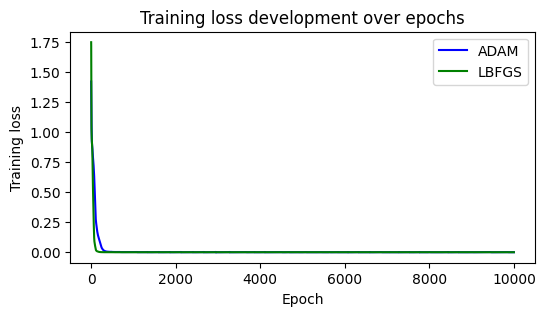

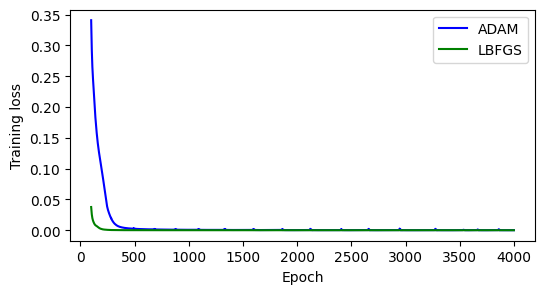

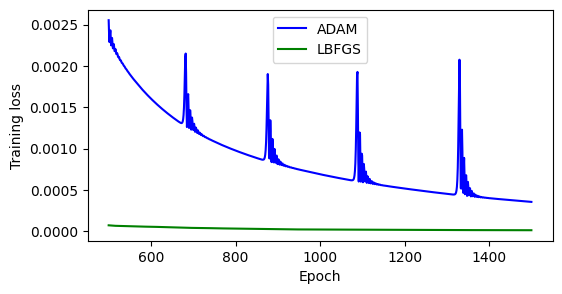

In [ ]:
# Plot the training losses over the epochs
plt.figure(figsize=(6, 3))
epoch = np.arange(len(training_losses_adam))
plt.plot(epoch, training_losses_adam, c='b', label='ADAM')
plt.plot(epoch, training_losses_lbfgs, c='g', label='LBFGS')
plt.legend()
plt.title("Training loss development over epochs")
plt.xlabel("Epoch")
plt.ylabel("Training loss")
plt.show()

plt.figure(figsize=(6, 3))
epoch = np.arange(100,4000)
plt.plot(epoch, training_losses_adam[100:4000], c='b', label='ADAM')
plt.plot(epoch, training_losses_lbfgs[100:4000], c='g', label='LBFGS')
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Training loss")
plt.show()

plt.figure(figsize=(6, 3))
epoch = np.arange(500,1500)
plt.plot(epoch, training_losses_adam[500:1500], c='b', label='ADAM')
plt.plot(epoch, training_losses_lbfgs[500:1500], c='g', label='LBFGS')
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Training loss")
plt.show()

In the plots above, the training losses are plotted over the epochs. As can be seen by zooming in on the training loss development over the epochs, the training loss of the adam optimiser fluctuates much more than the LBFGS optimiser. The LBFGS optimiser also achieves quicker convergence and a lower final training loss. Therefore, although the LBFGS optimiser takes longer to backpropagate, it performs better than Adam. This optimiser is used from now on.

In [ ]:
# Define the trained pinn that will be used from now on
pinn = pinn_lbfgs

Now that the PINN model is trained, we use new test data (x and t values) to determine the predicted output of the trained model. This is compared with the output coming from the exact solution. The predicted values, the exact values and the absolute error are plotted for the values of x and t.

In [ ]:
# Create data to compare predicted and true theta and w
alt.data_transformers.disable_max_rows()
grid_size = 80

x = torch.linspace(0, torch.pi, grid_size+1)
t = torch.linspace(0, 1, grid_size+1)

grid_x, grid_t = torch.meshgrid(x, t)
test_input = torch.cat([grid_x.reshape(-1, 1), grid_t.reshape(-1, 1)], dim=1).to(device)

pred_test = pinn(test_input).cpu().detach()
pred_theta, pred_w = pred_test[:,0], pred_test[:,1]

grid_pred_theta, grid_pred_w = pred_theta.reshape(grid_size+1, grid_size+1), pred_w.reshape(grid_size+1, grid_size+1)
grid_true_theta, grid_true_w = exact_solution(grid_x, grid_t)

# Create a DataFrame for Altair plotting
df = pd.DataFrame({'x': grid_x.ravel().detach() / pi, 't': grid_t.ravel().detach(),
                   'pred_theta': grid_pred_theta.flatten(), 'true_theta': grid_true_theta.flatten(),
                   'pred_w': grid_pred_w.flatten(), 'true_w': grid_true_w.flatten()})

# Calculate the errors of the theta and w predictions
df['theta_error'] = abs(df['pred_theta'] - df['true_theta'])
df['w_error'] = abs(df['pred_w'] - df['true_w'])

# Define the color domain of the Altair charts
colordomain_w = max(max(abs(df['true_w'])), max(abs(df['pred_w'])))
colordomain_theta = max(max(abs(df['true_theta'])), max(abs(df['pred_theta'])))

# Define the size of the subplots
subplot_size = 250

# Create the plots of the prediction and true values of theta and w
pred_theta_chart = alt.Chart(df).mark_rect().encode(
    alt.X('t:O', axis=alt.Axis(title='t (s)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Y('x:O', axis=alt.Axis(title='x/ \u03C0 (m)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Color('pred_theta:Q', scale=alt.Scale(scheme='redyellowgreen', domainMin=-colordomain_theta, domainMax=colordomain_theta), title='\u03B8'),
    tooltip=['pred_theta:Q', 'true_theta:Q']
).properties(
    width=subplot_size,
    height=subplot_size,
    title='Predicted \u03B8'
)

true_theta_chart = alt.Chart(df).mark_rect().encode(
    alt.X('t:O', axis=alt.Axis(title='t (s)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Y('x:O', axis=alt.Axis(title = None, ticks=False, labels=False)),
    alt.Color('true_theta:Q', scale=alt.Scale(scheme='redyellowgreen', domainMin=-colordomain_theta, domainMax=colordomain_theta)),
    tooltip=['pred_theta:Q', 'true_theta:Q']
).properties(
    width=subplot_size,
    height=subplot_size,
    title='True \u03B8'
)

pred_w_chart = alt.Chart(df).mark_rect().encode(
    alt.X('t:O', axis=alt.Axis(title='t (s)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Y('x:O', axis=alt.Axis(title='x/ \u03C0 (m)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Color('pred_w:Q', scale=alt.Scale(scheme='redyellowgreen', domainMin=-colordomain_w, domainMax=colordomain_w), title='w'),
    tooltip=['pred_w:Q', 'true_w:Q']
).properties(
    width=subplot_size,
    height=subplot_size,
    title='Predicted w'
)

true_w_chart = alt.Chart(df).mark_rect().encode(
    alt.X('t:O', axis=alt.Axis(title='t (s)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Y('x:O', axis=alt.Axis(title = None, ticks=False, labels=False)),
    alt.Color('true_w:Q', scale=alt.Scale(scheme='redyellowgreen', domainMin=-colordomain_w, domainMax=colordomain_w)),
    tooltip=['pred_w:Q', 'true_w:Q']
).properties(
    width=subplot_size,
    height=subplot_size,
    title='True w'
)

theta_error_chart = alt.Chart(df).mark_rect().encode(
    alt.X('t:O', axis=alt.Axis(title='t (s)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Y('x:O', axis=alt.Axis(title='x/ \u03C0 (m)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Color('theta_error:Q', scale=alt.Scale(scheme='yelloworangered'), title='Absolute error'),
    tooltip=['theta_error:Q']
).properties(
    width=subplot_size,
    height=subplot_size,
    title='Error of \u03B8 prediction'
)


w_error_chart = alt.Chart(df).mark_rect().encode(
    alt.X('t:O', axis=alt.Axis(title='t (s)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Y('x:O', axis=alt.Axis(title = None, ticks=False, labels=False)),
    alt.Color('w_error:Q', scale=alt.Scale(scheme='yelloworangered')),
    tooltip=['w_error:Q']
).properties(
    width=subplot_size,
    height=subplot_size,
    title='Error of w prediction'
)


# Display the theta and w charts
(pred_theta_chart | true_theta_chart).display()
(pred_w_chart | true_w_chart).display()
(theta_error_chart | w_error_chart).display()

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


alt.HConcatChart(...)

alt.HConcatChart(...)

alt.HConcatChart(...)

![w_forward](https://github.com/DaanExterkate/CEGM2003---BEAM2/blob/main/animations/w_forward.gif?raw=true "w_forward")


![theta_forward](https://github.com/DaanExterkate/CEGM2003---BEAM2/blob/main/animations/theta_forward%20(2).gif?raw=true "theta_forward")




The relative error is computed for the tested data points by:

$\epsilon_{\text{re}} [\%] = \frac{\frac{1}{N} \sum_{i=0}^{n} (u_{\text{true}} - u_{\text{pred}})^2}{\frac{1}{N} \sum_{i=0}^{n} u_{\text{true}}^2} \times 100\%$




In [ ]:
relative_error_theta = np.mean(df['theta_error']**2) / np.mean(df['true_theta']**2)
relative_error_w = np.mean(df['w_error']**2) / np.mean(df['true_w']**2)

print("Relative Error Test theta: ", relative_error_theta*100, "%")
print("Relative Error Test w: ", relative_error_w*100, "%")

Relative Error Test theta:  0.00030722706014785217 %
Relative Error Test w:  1.4943523751753673e-05 %


The model trained above, according to the manually optimised hyperparamters, result in an error (<0.01%). This test error indicates that this model is sufficiently accurate to be used in the inverse problem, described below.

## 2.2 Inverse Problem

PINN-related inverse problems are smart way to for example determine material properties leveraging the PDE and beam's displacementand rotation data. Monitoring the data, together with the underlying theory regarding the beam's structural behaviour can help to infer internal material properties. The PINN uses the combination of physics and deep learning by means of a NN. The aim of inverse PINNs is to determine 1 or more unknown parameters from the PDE. This can be helpful when giving structural diagnosis regarding the current structural state of for example a bridge.

In the context of this Timoshenko Inverse problem, the PINN is trained on the observations of $\theta$ (rotation) and w (deflection), while the aim is to determine the unknown forcing g(x,t). A PINN is trained to predict $\theta$, w and g(x,t). These are all incorporated in the loss function, which consists of a loss regarding data loss and physics loss. The data loss relates the outcomes of u and $\theta$ to the observed deflections and rotations, whereas the physical loss takes care of the overall physical structural behaviour by means of the coupled Timoshenko PDE's. To obtain monitoring data, sensors are placed along the beam. In this problem, an investigation is done in where and how much sensors should be placed along the beam to get sufficient reasonable results/ predictions of the forcing g(x,t).

The optimal amount and placing of sensors is extremely arbitrary, since there is no knowledge about costs, possible placements of sensors, amount of observations of a sensor in time or preferences. Our goal is to try and find the least number of sensors required to obtain a relative test error below 5%, given 1 datapoint per millisecond (1000 datapoints/s) and a linear spacing of sensors. After this goal is met, it is checked if disregarding the assumption of a linear spacing of sensors can lead to even better relative test errors.

For the neural network a MultiLayer Perceptron is used with 4 hidden layers, 20 neurons per layer, input x and t, and output g, $\theta$ and w. Now, the loss function only consists of two parts: a data loss coming from observations and a physics loss. These parts are again regularized with a hyperparameters $\lambda$1 and $\lambda$2, which can prioritize certain parts of the loss. See the Figure below.

Other hyperparameters are the learning rate, number of epochs and which optimiser to choose. As in the previous problem, again LBFGS is used as the optimiser, as it gets good results. The rest of the hyperparameters are determined by reviewing similar research [1] and manually optimised by comparing the relative test errors of resulting models.

First, we make sure the code is working for application in the investigation of number of sensors. After this is verified and get reasonable results, we can start the optimisation subsequently.

![Schematic of the PINN that approximates the exact solutions for theta, w and g](https://github.com/DaanExterkate/CEGM2003---BEAM2/blob/main/Timoshenko%20inverse%20schematic.png?raw=true "Schematic of the PINN that approximates the exact solutions for theta, w and g")

## Make sure the code works for optimising
First we make sure that the code is working. We do this check by using 5 sensors. Obviously, if reasonable results are obtained for this part, we can start with investigation of the optimal numbers of sensors.

In [ ]:
# Define the function used to train the inverse pinn
def fit_pinn_inverse(hidden_features, hidden_layers, n_epochs, lambdas, sensor_locations, learning_rate, activation_function='tanh', xavier_initialization=True, opt_type='LBFGS', prints=True):
    '''
    Function to train the inverse PINN model

    Parameters
    ----------------------
    hidden_features:        float
                            Amount of neurons per hidden layer.
    hidden_layers:          float
                            Amount of hidden layers used for neural network.
    n_epochs:               float
                            Amount of epochs the neural network is trained.
    lambdas:                torch.Tensor
                            Tensor with pre-defined regularization terms which are multiplied by the specific loss terms. Order: Initialization, boundary and interior.
    sensor_locations:       torch.tensor
                            Locations of the sensors in the x and t space. The tensor should contain the flattened meshgrids of x and t, with x on the first column and t on the second column.
    learning_rate:          float
                            Value of the learning rate.
    activation_function:    string
                            Activation function used in neural network.
    xavier_initialization:  Boolean
                            True or False for usage of the initialization function.
    opt_type:               string
                            Type of optimizer used in training: "ADAM" or "LBFGS".

    Returns
    ------------------------
    pinn:                   Object from MLP-class
                            Trained PINN model.
    training_losses:        torch.tensor
                            Training losses for all epochs.
    '''

    print(f'-------- Training with {hidden_features} hidden features, {hidden_layers} hidden layers, {n_epochs} epochs, lambda = {lambdas}, learning_rate = {learning_rate}, activation function = {activation_function}. ---------')

    inverse_pinn = MLP(2, hidden_features, 3, hidden_layers=hidden_layers, activation_function=activation_function).to(device)

    if xavier_initialization==True:
      init_xavier(inverse_pinn, retrain) # Xavier weight initialization

    # Select the optimiser
    if opt_type == "ADAM":
        optimiser = torch.optim.Adam(inverse_pinn.parameters(), lr=learning_rate)
    elif opt_type == "LBFGS":
        optimiser = torch.optim.LBFGS(inverse_pinn.parameters(), lr=learning_rate, max_iter=1, max_eval=50000, tolerance_change=1.0 * np.finfo(float).eps)
    else:
        raise ValueError("Optimizer not recognized")

    # Generate sensor observations for theta and w using the previously trained pinn
    sensor_observations = pinn(sensor_locations.to(device))
    theta_observations, w_observations = sensor_observations[:,0], sensor_observations[:,1]

    # Recording of training losses over the epochs
    training_losses = []

    # Loop through the epochs
    for epoch in range(n_epochs+1):

      running_loss = [0]

      def closure():
        # Zero out the previously computed gradients of the optimizable parameters
        optimiser.zero_grad()

        # Compute data loss
        sensor_predictions = inverse_pinn(sensor_locations.to(device))
        theta_predictions, w_predictions, _ = sensor_predictions[:,0], sensor_predictions[:,1], sensor_predictions[:,2]

        data_loss_theta = torch.mean((theta_predictions - theta_observations)**2)
        data_loss_w = torch.mean((w_predictions - w_observations)**2)

        data_loss = data_loss_theta + data_loss_w

        # Compute physics loss
        x, t = interior[:,0], interior[:,1]
        interior.requires_grad = True
        pred_interior = inverse_pinn(interior)
        pred_theta_interior, pred_w_interior, pred_g_interior = pred_interior[:,0], pred_interior[:,1], pred_interior[:, 2]

        theta_x_theta_t = torch.autograd.grad(pred_theta_interior, interior, torch.ones_like(pred_theta_interior), create_graph=True)[0]
        theta_x, theta_t = theta_x_theta_t[:,0], theta_x_theta_t[:,1]
        theta_xx = torch.autograd.grad(theta_x, interior, torch.ones_like(theta_x), create_graph=True)[0][:, 0]
        theta_tt = torch.autograd.grad(theta_t, interior, torch.ones_like(theta_t), create_graph=True)[0][:, 1]

        w_x_w_t = torch.autograd.grad(pred_w_interior, interior, torch.ones_like(pred_w_interior), create_graph=True)[0]
        w_x, w_t = w_x_w_t[:,0], w_x_w_t[:,1]
        w_xx = torch.autograd.grad(w_x, interior, torch.ones_like(w_x), create_graph=True)[0][:, 0]
        w_tt = torch.autograd.grad(w_t, interior, torch.ones_like(w_t), create_graph=True)[0][:, 1]

        physics_loss_theta = torch.mean((rho*I*theta_tt - E*I*theta_xx - k*A*G*(w_x-pred_theta_interior))**2)
        physics_loss_w = torch.mean((rho*A*w_tt - k*A*G*(w_xx-theta_x) - pred_g_interior)**2)

        physics_loss = physics_loss_theta + physics_loss_w

        # Calculate the joint loss using the regularization terms in the lambdas tensor
        loss = lambdas[0] * data_loss + lambdas[1] * physics_loss

        # Backpropagate the joint loss
        loss.backward(retain_graph=True)
        running_loss[0] += loss.item()

        return loss

      # Take optimiser step
      optimiser.step(closure=closure)

      training_losses.append(running_loss[0] / len(sensor_locations))

      # Print the result as training progresses
      if prints == True:
        if epoch % 1000 == 0:
              print(f"#############################    Epoch {epoch:4d}    #############################")
              print(f'training_loss = {running_loss[0] / len(sensor_locations)}')

    # print("")

    return inverse_pinn, training_losses


In [ ]:
# Train the inverse pinn
n_epochs = 6000
lambdas = torch.tensor([1, 0.05], dtype=torch.float32)  # in the order of [data, physics]
learning_rate = 0.1

n_sensors = 5
n_datapoints = 1000

x_sensors = torch.linspace(0, torch.pi, n_sensors*2+1)[1:-1:2]
t_sensors = torch.linspace(0, 1, n_datapoints)

grid_x, grid_t = torch.meshgrid(x_sensors, t_sensors)

sensor_locations = torch.cat([grid_x.reshape(-1, 1), grid_t.reshape(-1, 1)], dim=1).to(device)

inverse_pinn, training_losses = fit_pinn_inverse(30, 4, n_epochs, lambdas, sensor_locations, learning_rate, xavier_initialization=False, prints=True)

-------- Training with 30 hidden features, 4 hidden layers, 6000 epochs, lambda = tensor([1., 1.]), learning_rate = 0.1, activation function = tanh. ---------
#############################    Epoch    0    #############################
training_loss = 0.0001822985529899597
#############################    Epoch 1000    #############################
training_loss = 9.66519583016634e-09
#############################    Epoch 2000    #############################
training_loss = 1.917414556373842e-09
#############################    Epoch 3000    #############################
training_loss = 6.617009603360202e-10
#############################    Epoch 4000    #############################
training_loss = 6.571314770553726e-10
#############################    Epoch 5000    #############################
training_loss = 6.541692073369632e-10
#############################    Epoch 6000    #############################
training_loss = 6.517667316074949e-10


In [ ]:
# Plot the training losses over the epochs
df = pd.DataFrame({'Epoch': np.arange(1000,len(training_losses)), 'Training loss': training_losses[1000:]})

alt.Chart(df).mark_line().encode(
    x = 'Epoch',
    y = 'Training loss'
).properties(
    width = 900
).display()

alt.Chart(...)

In [ ]:
# Display the predictions and true values of g and the prediction error
grid_size = 100
x = torch.linspace(0, torch.pi, grid_size+1)
t = torch.linspace(0, 1, grid_size+1)

grid_x, grid_t = torch.meshgrid(x, t)
test_input = torch.cat([grid_x.reshape(-1, 1), grid_t.reshape(-1, 1)], dim=1).to(device)

pred_test = inverse_pinn(test_input).cpu().detach()
pred_theta, pred_w, pred_g = pred_test[:,0], pred_test[:,1], pred_test[:,2]

grid_pred_theta, grid_pred_w, grid_pred_g = pred_theta.reshape(grid_size+1, grid_size+1), pred_w.reshape(grid_size+1, grid_size+1), pred_g.reshape(grid_size+1, grid_size+1)
grid_true_g = g(grid_x, grid_t)

# Create a DataFrame for Altair plotting
df = pd.DataFrame({'x': grid_x.ravel().detach()/pi, 't': grid_t.ravel().detach(),
                   'pred_g': grid_pred_g.flatten(), 'true_g': grid_true_g.flatten()})

# Calculate the errors of the theta and w predictions
df['g_error'] = abs(df['pred_g'] - df['true_g'])

# Create a second DataFrame for plotting the sensor locations
df2 = pd.DataFrame({'x': x_sensors / pi})

# Define the color domain of the Altair charts
colordomain_g = max(max(abs(df['true_g'])), max(abs(df['pred_g'])))

# Define the size of the subplots
subplot_size = 250

# Create the plots of the prediction and true values of g
pred_g_chart = alt.Chart(df).mark_rect().encode(
    alt.X('t:O', axis=alt.Axis(title='t (s)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Y('x:O', axis=alt.Axis(title='x/ \u03C0 (m)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1]), scale=alt.Scale(reverse=True)),
    alt.Color('pred_g:Q', scale=alt.Scale(scheme='redyellowgreen', domainMin=-colordomain_g, domainMax=colordomain_g)),
    tooltip=['pred_g:Q', 'true_g:Q']
).properties(
    width=subplot_size,
    height=subplot_size,
    title='Predicted g'
)

rule = alt.Chart(df2).mark_rule(color = 'black').encode(
    y='x:O',
    size=alt.value(2),
    opacity = alt.value(0.3)
)

true_g_chart = alt.Chart(df).mark_rect().encode(
    alt.X('t:O', axis=alt.Axis(title='t (s)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Y('x:O', axis=alt.Axis(title='x/ \u03C0 (m)', ticks=False, labels=False), scale=alt.Scale(reverse=True)),
    alt.Color('true_g:Q', title='g', scale=alt.Scale(scheme='redyellowgreen', domainMin=-colordomain_g, domainMax=colordomain_g)),
    tooltip=['pred_g:Q', 'true_g:Q']
).properties(
    width=subplot_size,
    height=subplot_size,
    title='True g'
)

g_error_chart = alt.Chart(df).mark_rect().encode(
    alt.X('t:O', axis=alt.Axis(title='t (s)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Y('x:O', axis=alt.Axis(title='x/ \u03C0 (m)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1]), scale=alt.Scale(reverse=True)),
    alt.Color('g_error:Q', scale=alt.Scale(scheme='yelloworangered'), title='Absolute error'),
    tooltip=['g_error:Q']
).properties(
    width=subplot_size,
    height=subplot_size,
    title='Error of g prediction'
)

# Display the g charts
((pred_g_chart + rule) | true_g_chart).display()
g_error_chart.display()

alt.HConcatChart(...)

alt.Chart(...)

In [ ]:
relative_error_g = np.mean(df['g_error']**2) / np.mean(df['true_g']**2)
tweede_optie = np.mean(df['g_error']**2 / df['true_g']**2)

print("Relative Error Test g: ", round(relative_error_g*100, 2), "%")

Relative Error Test g:  3.57 %


## Find optimal number of sensors and sensor locations

The methodology to find the optimal number of sensors is done in two steps. When using sensors, there are mainly 3 variables, i.e. the amount of sensors, the locations of these sensors and the amount of datapoints per sensor (sample rate). We fix the latter on 1000 datapoints per second. This is based on equivalent research done [1]. We are therefore left with 2 variables. First, the amount of sensors is determined. We find this by comparing the results of implementing N=4 up to N=12 sensors. Since sensors are expensive, we prefer using less sensors. However, fewer sensors will decrease the accuracy. A trade-off should be made.

The number of sensors are distributed along the beam axis such that every sensor has an equal reach and every point along the axis is taken care of by 1 sensor equally. When using 2 sensors, the sensors are located at 0.25L and 0.75L. The middle point is as far away from a sensor as a point at the boundary of the beam. For 3 sensors this means we locate them at x=1/6L, 3/6L and 5/6L. Et cetera. For every amount of sensors, we do the run 5 times because the relative error can fluctuate a lot over various runs. We compare the mean value and plot it. Based on this, we choose an optimal number of sensors. Again, this is a trade-off. The relative error should be at least below 5%. We assume this as sufficiently accurate.

For the 2nd part, the locations of the found optimal number of sensors are investigated. Of course, this is extremely arbitrary and there are infinite possibilities. Though, it makes sense to place them somewhat distributed along the beam axis and not concentrate all sensors near the boundaries. The found optimal locations are determined empirically. A reasonable approach is to shift sensors to locations where the current output is not as accurate as desired. The final output shown in the codecell is the optimised one.  


### Optimal number of sensors

In [ ]:
# Train the inverse pinn
n_epochs = 6000
lambdas = torch.tensor([1, 0.05], dtype=torch.float32)  # in the order of [initial, boundary, physics]
learning_rate = 0.1

n_datapoints = 1000
t_sensors = torch.linspace(0, 1, n_datapoints)
min_sensors = 4
max_sensors = 12
n_runs = 5

grid_true_g = g(grid_x, grid_t)
true_g = grid_true_g.ravel()
n_sensors = np.arange(min_sensors, max_sensors+1)
r_errors = torch.zeros((len(n_sensors), n_runs))

# Loop through the different options for sensor amounts
for i in range(len(n_sensors)):
  print(f'######################### Running {n_runs} training runs for {n_sensors[i]} sensors #########################')
  x_sensors = torch.linspace(0, torch.pi, n_sensors[i]*2+1)
  x_sensors = x_sensors[1:-1:2]
  grid_x_train, grid_t_train = torch.meshgrid(x_sensors, t_sensors)

  sensor_locations = torch.cat([grid_x_train.reshape(-1,1), grid_t_train.reshape(-1,1)], dim=1).to(device)

  # Loop through the runs
  for run in range(n_runs):

    inverse_pinn, training_losses = fit_pinn_inverse(30, 4, n_epochs, lambdas, sensor_locations, learning_rate, xavier_initialization=False, prints=False)

    predictions = inverse_pinn(test_input).cpu()
    pred_theta, pred_w, pred_g = predictions[:,0], predictions[:,1], predictions[:,2]
    g_error = pred_g - true_g
    eps_re = torch.mean(g_error ** 2) / torch.mean(grid_true_g ** 2)
    r_errors[i, run] = eps_re * 100

    print(f'Relative errors for {len(x_sensors)} sensors, run {run+1} =  {r_errors[i].detach().numpy()} %')

  print("\n")

######################### Running 5 training runs for 4 sensors #########################
-------- Training with 30 hidden features, 4 hidden layers, 6000 epochs, lambda = tensor([1.0000, 0.0500]), learning_rate = 0.1, activation function = tanh. ---------
Relative errors for 4 sensors, run 1 =  [119.64054   0.        0.        0.        0.     ] %
-------- Training with 30 hidden features, 4 hidden layers, 6000 epochs, lambda = tensor([1.0000, 0.0500]), learning_rate = 0.1, activation function = tanh. ---------
Relative errors for 4 sensors, run 2 =  [119.64054 125.16903   0.        0.        0.     ] %
-------- Training with 30 hidden features, 4 hidden layers, 6000 epochs, lambda = tensor([1.0000, 0.0500]), learning_rate = 0.1, activation function = tanh. ---------
Relative errors for 4 sensors, run 3 =  [119.64054  125.16903  112.807465   0.         0.      ] %
-------- Training with 30 hidden features, 4 hidden layers, 6000 epochs, lambda = tensor([1.0000, 0.0500]), learning_rate 

KeyboardInterrupt: 

In [ ]:
# Visualizing the results
for i in np.arange(1, len(n_sensors)):
  for run in range(n_runs):
    plt.scatter(n_sensors[i], r_errors[i, run].detach().numpy(), c='green')

plt.title('Relative test error for several numbers of sensors')
plt.xlabel('Number of sensors')
plt.ylabel('Relative test error (%)')

### Optimal locations

In [ ]:
# Train the inverse pinn
n_epochs = 6000
lambdas = torch.tensor([1, 0.08], dtype=torch.float32)  # in the order of [data, physics]
learning_rate = 0.1

n_sensors = 5
n_datapoints = 1000

x_sensors = torch.linspace(0, torch.pi, n_sensors*2)[1::2]
t_sensors = torch.linspace(0, 1, n_datapoints)

grid_x_train, grid_t_train = torch.meshgrid(x_sensors, t_sensors)
sensor_locations = torch.cat([grid_x_train.reshape(-1, 1), grid_t_train.reshape(-1, 1)], dim=1).to(device)

grid_size = 100
x_test = torch.linspace(0, torch.pi, grid_size+1)
t_test = torch.linspace(0, 1, grid_size+1)
grid_x, grid_t = torch.meshgrid(x, t)
test_input = torch.cat([grid_x.reshape(-1, 1), grid_t.reshape(-1, 1)], dim=1).to(device)

grid_true_g = g(grid_x, grid_t)
true_g = grid_true_g.ravel()

r_errors=[]

# Loop through the runs
for run in range(5):

  inverse_pinn, training_losses = fit_pinn_inverse(30, 4, n_epochs, lambdas, sensor_locations, learning_rate, xavier_initialization=False, prints=False)

  predictions = inverse_pinn(test_input).cpu()
  pred_theta, pred_w, pred_g = predictions[:,0], predictions[:,1], predictions[:,2]
  g_error = pred_g - true_g
  eps_re = torch.mean(g_error ** 2) / torch.mean(grid_true_g ** 2)
  r_errors.append(eps_re * 100)

  print(f'Relative errors for {len(x_sensors)} sensors, run {run+1} =  {r_errors[-1].detach().numpy()} %')

tensor([0.3491, 1.0472, 1.7453, 2.4435, 3.1416])


TypeError: expected Tensor as element 0 in argument 0, but got numpy.ndarray

In [ ]:
# Create a DataFrame for Altair plotting
df = pd.DataFrame({'x': grid_x.ravel().detach()/pi, 't': grid_t.ravel().detach(),
                   'pred_g': pred_g.detach(), 'true_g': true_g.detach()})

# Calculate the errors of the theta and w predictions
df['g_error'] = abs(df['pred_g'] - df['true_g'])

# Create a second DataFrame for plotting the sensor locations
df2 = pd.DataFrame({'x': x_sensors / pi})

# Define the color domain of the Altair charts
colordomain_g = max(max(abs(df['true_g'])), max(abs(df['pred_g'])))

# Define the size of the subplots
subplot_size = 250

# Create the plots of the prediction and true values of g
pred_g_chart = alt.Chart(df).mark_rect().encode(
    alt.X('t:O', axis=alt.Axis(title='t (s)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Y('x:O', axis=alt.Axis(title='x/ \u03C0 (m)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1]), scale=alt.Scale(reverse=True)),
    alt.Color('pred_g:Q', scale=alt.Scale(scheme='redyellowgreen', domainMin=-colordomain_g, domainMax=colordomain_g)),
    tooltip=['pred_g:Q', 'true_g:Q']
).properties(
    width=subplot_size,
    height=subplot_size,
    title='Predicted g'
)

rule = alt.Chart(df2).mark_rule(color = 'black').encode(
    y='x:O',
    size=alt.value(2),
    opacity = alt.value(0.3)
)

true_g_chart = alt.Chart(df).mark_rect().encode(
    alt.X('t:O', axis=alt.Axis(title='t (s)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Y('x:O', axis=alt.Axis(title='x/ \u03C0 (m)', ticks=False, labels=False), scale=alt.Scale(reverse=True)),
    alt.Color('true_g:Q', title='g', scale=alt.Scale(scheme='redyellowgreen', domainMin=-colordomain_g, domainMax=colordomain_g)),
    tooltip=['pred_g:Q', 'true_g:Q']
).properties(
    width=subplot_size,
    height=subplot_size,
    title='True g'
)

g_error_chart = alt.Chart(df).mark_rect().encode(
    alt.X('t:O', axis=alt.Axis(title='t (s)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Y('x:O', axis=alt.Axis(title='x/ \u03C0 (m)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1]), scale=alt.Scale(reverse=True)),
    alt.Color('g_error:Q', scale=alt.Scale(scheme='yelloworangered'), title='Absolute error'),
    tooltip=['g_error:Q']
).properties(
    width=subplot_size,
    height=subplot_size,
    title=f'Error of g prediction. RE = {r_errors[-1]:.2f}%'
)

# Display the g charts
((pred_g_chart + rule) | true_g_chart).display()
g_error_chart.display()

In the prediction error chart above, it can be seen that by relocating a sensor to the right boundary of the beam (x=$\pi$), the prediction error has decreased and is more even over the x-t space. Further optimization of the sensor locations, by gradually moving them towards the locations with higher errors could decrease the error even more. However, as the prediction error changes greatly across different trained models, this investigation would require gradual stepping, which would make it very extensive. Therefore, this falls outside of the scope of this research.

# Training PINN with optimised hyperparamers and optimal sensor locations

In [ ]:
# Train the inverse pinn
n_epochs = 15000
lambdas = torch.tensor([1, 0.05], dtype=torch.float32)  # in the order of [data, physics]
learning_rate = 0.1

inverse_pinn, training_losses = fit_pinn_inverse(30, 4, n_epochs, lambdas, sensor_locations, learning_rate, xavier_initialization=False, prints=True)

predictions = inverse_pinn(test_input).cpu()
pred_theta, pred_w, pred_g = predictions[:,0], predictions[:,1], predictions[:,2]
g_error = pred_g - true_g
eps_re = torch.mean(g_error ** 2) / torch.mean(grid_true_g ** 2)

print(f'Relative error of the optimised model  =  {eps_re.detach().numpy()*100} %')

-------- Training with 30 hidden features, 4 hidden layers, 15000 epochs, lambda = tensor([1.0000, 0.0500]), learning_rate = 0.1, activation function = tanh. ---------
#############################    Epoch    0    #############################
training_loss = 0.0002143808603286743
#############################    Epoch 1000    #############################
training_loss = 4.507468111114577e-09
#############################    Epoch 2000    #############################
training_loss = 8.24664493848104e-10
#############################    Epoch 3000    #############################
training_loss = 4.720868219010299e-10
#############################    Epoch 4000    #############################
training_loss = 4.686553438659758e-10
#############################    Epoch 5000    #############################
training_loss = 4.660967533709481e-10
#############################    Epoch 6000    #############################
training_loss = 4.639187409338774e-10
############################

In [ ]:
grid_true_g = g(grid_x, grid_t)
true_g = grid_true_g.ravel()

g_error = pred_g - true_g
eps_re = torch.mean(g_error ** 2) / torch.mean(grid_true_g ** 2)

print(f'Relative error of the optimised model  =  {eps_re.detach().numpy()*100} %')

grid_size = 100
x = torch.linspace(0, torch.pi, grid_size+1)
t = torch.linspace(0, 1, grid_size+1)

grid_x, grid_t = torch.meshgrid(x, t)
test_input = torch.cat([grid_x.reshape(-1, 1), grid_t.reshape(-1, 1)], dim=1).to(device)

pred_test = inverse_pinn(test_input).cpu().detach()
pred_theta, pred_w, pred_g = pred_test[:,0], pred_test[:,1], pred_test[:,2]

grid_pred_theta, grid_pred_w, grid_pred_g = pred_theta.reshape(grid_size+1, grid_size+1), pred_w.reshape(grid_size+1, grid_size+1), pred_g.reshape(grid_size+1, grid_size+1)
grid_true_g = g(grid_x, grid_t)

# Create a DataFrame for Altair plotting
df = pd.DataFrame({'x': grid_x.ravel().detach()/pi, 't': grid_t.ravel().detach(),
                   'pred_g': grid_pred_g.flatten(), 'true_g': grid_true_g.flatten()})

# Calculate the errors of the theta and w predictions
df['g_error'] = abs(df['pred_g'] - df['true_g'])

# Create a second DataFrame for plotting the sensor locations
df2 = pd.DataFrame({'x': x_sensors / pi})

# Define the color domain of the Altair charts
colordomain_g = max(max(abs(df['true_g'])), max(abs(df['pred_g'])))

# Define the size of the subplots
subplot_size = 250

# Create the plots of the prediction and true values of g
pred_g_chart = alt.Chart(df).mark_rect().encode(
    alt.X('t:O', axis=alt.Axis(title='t (s)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Y('x:O', axis=alt.Axis(title='x/ \u03C0 (m)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1]), scale=alt.Scale(reverse=True)),
    alt.Color('pred_g:Q', scale=alt.Scale(scheme='redyellowgreen', domainMin=-colordomain_g, domainMax=colordomain_g)),
    tooltip=['pred_g:Q', 'true_g:Q']
).properties(
    width=subplot_size,
    height=subplot_size,
    title='Predicted g'
)

rule = alt.Chart(df2).mark_rule(color = 'black').encode(
    y='x:O',
    size=alt.value(2),
    opacity = alt.value(0.3)
)

true_g_chart = alt.Chart(df).mark_rect().encode(
    alt.X('t:O', axis=alt.Axis(title='t (s)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Y('x:O', axis=alt.Axis(title='x/ \u03C0 (m)', ticks=False, labels=False), scale=alt.Scale(reverse=True)),
    alt.Color('true_g:Q', title='g', scale=alt.Scale(scheme='redyellowgreen', domainMin=-colordomain_g, domainMax=colordomain_g)),
    tooltip=['pred_g:Q', 'true_g:Q']
).properties(
    width=subplot_size,
    height=subplot_size,
    title='True g'
)

g_error_chart = alt.Chart(df).mark_rect().encode(
    alt.X('t:O', axis=alt.Axis(title='t (s)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1])),
    alt.Y('x:O', axis=alt.Axis(title='x/ \u03C0 (m)', ticks=True, labels=True, values = [0,0.25, 0.5, 0.75, 1]), scale=alt.Scale(reverse=True)),
    alt.Color('g_error:Q', scale=alt.Scale(scheme='yelloworangered'), title='Absolute error'),
    tooltip=['g_error:Q']
).properties(
    width=subplot_size,
    height=subplot_size,
    title='Error of g prediction'
)

# Display the g charts
((pred_g_chart + rule) | true_g_chart).display()
g_error_chart.display()

Relative error of the optimised model  =  5.654382705688477 %


alt.HConcatChart(...)

alt.Chart(...)

![w_inverse](https://github.com/DaanExterkate/CEGM2003---BEAM2/blob/main/animations/w_inverse2.gif?raw=true "w_inverse")

![theta_inverse](https://github.com/DaanExterkate/CEGM2003---BEAM2/blob/main/animations/theta_inverse2.gif?raw=true "theta_inverse")

![g_inverse1](https://github.com/DaanExterkate/CEGM2003---BEAM2/blob/main/animations/g_inverse.gif?raw=true "g_inverse")

![g_inverse2](https://github.com/DaanExterkate/CEGM2003---BEAM2/blob/main/animations/g_inverse2.gif?raw=true "g_inverse")

#References

[1] Kapoor, T., Wang, H., Nunez, A., & Dollevoet, R. (2023). Physics-Informed Neural Networks for Solving Forward and Inverse Problems in Complex Beam Systems. IEEE Transactions on Neural Networks and Learning Systems, 1-15. https://doi.org/10.1109/TNNLS.2023.3310585

[2]  U. Goerguelue, “Beam theories: The difference between Euler–
Bernoulli and Timoschenko,” Lect. Note, 2009. [Online]. Available:
https://silo.tips/download/beam-theories-the-difference-between-eulerbernoulli-and-timoschenko#modals